In [1]:
import glob
import gzip
import os
import shutil
import sys
import time
from datetime import date
import numpy as np
import pandas as pd
import copy
import seaborn

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

def datetime_to_seconds(dates, ref="1900-01-01T00:00:00"):
    """from datetime64 to seconds since 1900-01-01 00:00:00"""
    return ((dates - np.datetime64(ref)) / np.timedelta64(1, "s")).astype(np.int64)

def seconds_to_datetime(seconds, ref="1900-01-01"):
    """from seconds to datetime64"""
    seconds = np.asarray(seconds)
    return pd.to_datetime(seconds, unit="s", origin=ref)

import matplotlib
import matplotlib.pylab as plt
import matplotlib.pyplot as maplt

matplotlib.rcParams.update({"font.size": 20})
matplotlib.rcParams["figure.figsize"] = (20, 10)

In [2]:
import cv2
import numpy as np
from tkinter import Tk, filedialog

from skimage.metrics import structural_similarity

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [3]:
import pytesseract

pytesseract.pytesseract.tesseract_cmd = "/usr/bin/tesseract"

def image_resize(image, width = None, height = None, inter = cv2.INTER_AREA):
    # initialize the dimensions of the image to be resized and
    # grab the image size
    dim = None
    (h, w) = image.shape[:2]

    # if both the width and height are None, then return the
    # original image
    if width is None and height is None:
        return image

    # check to see if the width is None
    if width is None:
        # calculate the ratio of the height and construct the
        # dimensions
        r = height / float(h)
        dim = (int(w * r), height)

    # otherwise, the height is None
    else:
        # calculate the ratio of the width and construct the
        # dimensions
        r = width / float(w)
        dim = (width, int(h * r))

    # resize the image
    resized = cv2.resize(image, dim, interpolation = inter)

    # return the resized image
    return resized

## CV2

In [4]:
def digitize(file, height_input = False, show_plots = False, fm=False):  
    # if len(glob.glob('./humidity/new_out/' + file.split('sc_')[-1].split('.png')[0]+'.csv')) > 0:
    #     return 0
    matplotlib.rcParams["figure.figsize"] = (4, 3)
    # try:
    %matplotlib inline
    print(file)
    # Load the image
    img = cv2.imread(file)
    # plt.imshow(img)
    # plt.show()
    # plt.close()

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply a threshold to create a binary image
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Find the contours in the binary image
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    # Find the contour with the largest area (i.e., the plot data)
    largest_contour = max(contours, key=cv2.contourArea)

    # Get the bounding box of the contour
    x, y, w, h = cv2.boundingRect(largest_contour)

    # Crop the image to the bounding box
    plot_only = img[y+10:y+h-1, x+1:x+w-1]
    relative_y = y+10
    relative_x = x+1
    relative_y_xaxis =  y+h-1

    # Save the cropped image
    cv2.imwrite('test_plot_only.png', plot_only)

    # Show the cropped image
    if show_plots:
        plt.imshow(plot_only)
        plt.show()
        plt.close()
    if np.mean(plot_only) <= 10:
        print('All black')
        return 0
    print(np.mean(plot_only))
    # Convert the contour to a numpy array and transpose it
    plot_data = largest_contour.squeeze().T

    # Print the plot data
    # print(plot_data)

    

    image = img[ 1269:1282, 20:500]
    # plt.imshow(image)
    # plt.show()
    # plt.close()
    print(np.mean(image))
    if np.mean(image) >= 205:
        print('All white')
        return 0

    image_l = image_resize(image, height = 50)
    gray = cv2.cvtColor(image_l, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (3,3), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Morph open to remove noise and invert image
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
    inverted = 255 - opening

    data = pytesseract.image_to_string(inverted, lang='eng', config= '--psm 7')



    im = cv2.imread("test_plot_only.png")

    # Define lower and upper limits of our blue
    BlueMax = np.array([128, 255, 255], np.uint8)
    BlueMin = np.array([90, 50, 70], np.uint8)

    # Go to HSV colourspace and get mask of blue pixels
    HSV = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)
    # plt.imshow(HSV)
    # plt.show()
    # plt.close()
    mask = cv2.inRange(HSV, BlueMin, BlueMax)

    # Make all pixels in mask white
    grid = copy.copy(im)
    grid[mask == 0] = [255, 255, 255]
    grid[0:, 0:15] = [255, 255, 255]


    im[mask > 0] = [255, 255, 255]
    im[0:100, 0:15] = [255, 255, 255]
    im[-2:, :] = [255, 255, 255]

    # plt.imshow(im)
    # plt.show()
    # plt.close()
    # plt.imshow(grid)
    # plt.show()
    # plt.close()
    cv2.imwrite("test_grid_only.png", grid)
    cv2.imwrite("test_data_only.png", im)



    # print("Analyzig grid:")

    grid = cv2.imread('test_grid_only.png')
    gray = cv2.cvtColor(grid, cv2.COLOR_BGR2GRAY)

    gray = np.float32(gray)

    dst = cv2.cornerHarris(gray, 5,19,0.07)
    dst = cv2.dilate(dst, None)

    # Get coordinates
    ret, dst = cv2.threshold(dst, 0.1 * dst.max(), 255, 0)
    dst = np.uint8(dst)

    # find centroids
    ret, labels, stats, centroids = cv2.connectedComponentsWithStats(dst)
    # define the criteria to stop and refine the corners
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 
                0.001)
    corners = cv2.cornerSubPix(gray,np.float32(centroids[1:]),(5,5), 
          (-1,-1),criteria)
    # To draw the corners
    for corner in corners:
        grid[int(corner[1]), int(corner[0])] = [0, 0, 255]
    corner_coords = np.asarray(corners, dtype = int)
    corner_coords = corner_coords[corner_coords[:,0] < np.max(corner_coords[:,0]) * 0.9]
    corner_coords = corner_coords[corner_coords[:,1] < np.max(corner_coords[:,1]) * 0.9]
    corner_coords = corner_coords[corner_coords[:,0] > np.max(corner_coords[:,0]) * 0.1]
    corner_coords = corner_coords[corner_coords[:,1] > np.max(corner_coords[:,1]) * 0.1]
    for co in corner_coords:
        grid = cv2.circle(grid, co, radius=4, color=(255, 0, 0), thickness=-1)
    # plt.imshow(grid)
    # plt.show()
    # plt.close()



    # choosing 2 points
    grid = cv2.imread('test_grid_only.png')
    # not on the very outside of the plot:
    maxcoord = np.argmax(np.sum(corner_coords, axis = 1))
    mincoord = np.argmin(np.sum(corner_coords, axis = 1))

    # coords_mean = meancoord
    coords_low = corner_coords[mincoord]
    coords_high = corner_coords[maxcoord]
    grid = cv2.circle(grid, coords_low, radius=4, color=(0, 0, 255), thickness=-1)
    grid = cv2.circle(grid, coords_high, radius=4, color=(0, 0, 255), thickness=-1)

    
    low_y_label = img[relative_y + coords_low[1]-10: relative_y + coords_low[1]+10, relative_x-45:relative_x-1]
    low_y_val = convert_label_y_2(low_y_label, show_input = False, show_plots = show_plots)
    print(low_y_val)
    
    high_y_label = img[relative_y + coords_high[1]-10: relative_y + coords_high[1]+10, relative_x-45:relative_x-1]
    high_y_val = convert_label_y_2(high_y_label, show_input = False, show_plots = show_plots)
    print(high_y_val)

    low_x_label = img[relative_y_xaxis+1 : relative_y_xaxis+20, relative_x+coords_low[0]-20:relative_x+coords_low[0]+30]
    low_x_val = convert_label(low_x_label, show_input = False, show_plots = show_plots, force_manual=fm)
    print(low_x_val)    
    
    high_x_label = img[relative_y_xaxis+1 : relative_y_xaxis+20, relative_x+coords_high[0]-30:relative_x+coords_high[0]+30]
    high_x_val = convert_label(high_x_label, show_input = False, show_plots = show_plots, force_manual=fm)
    print(high_x_val)
    
    print()
    
    if low_x_val > 0 and low_x_val > high_x_val:
        low_x_val = str(float(low_x_val) * -1)
        print('changed to: ', low_x_val)


    
    # converting axis texts to data:
    # print('low: ',coords_low, low_x_val, low_y_val)
    # print('high: ',coords_high, high_x_val, high_y_val)
    xa_p = [coords_low[0], coords_high[0]]
    xa_v = [low_x_val, high_x_val]
    ya_p = [coords_low[1], coords_high[1]]
    ya_v = [low_y_val, high_y_val]
    # display(xa_p)
    # display(xa_v)
    # display(ya_p)
    # display(ya_v)
    # print()

    
    # calculation of axis functions
    # x-axis
    x1 = xa_p[0]
    a = xa_v[0]
    x2 = xa_p[1]
    b = xa_v[1]

    m_T = (b - a) / (x2 - x1)
    c_T = a - m_T * x1
    def T(x):
        return m_T * x + c_T

    # y-axis
    if height_input:
        y1 = ya_p[0]
        ap = ya_v[0]
        y2 = ya_p[1]
        bp = ya_v[1]
    else: 
        y1 = ya_p[0]
        ap = np.log(ya_v[0])
        y2 = ya_p[1]
        bp = np.log(ya_v[1])

    m = (bp - ap) / (y2 - y1)
    c = ap - m * y1
    def P(x):
        return m * x + c

    
    # selection of data points via contour of graph:
    graph = cv2.imread('test_data_only.png')
    edge = cv2.Canny(graph, 30, 200) 
    ans = []
    for y in range(0, edge.shape[0]):
        for x in range(0, edge.shape[1]):
            if edge[y, x] != 0:
                ans = ans + [[x, y]]
    ans = np.array(ans)
    if len(ans) == 0:
        return 0

    # print(ans.shape)
    # print(ans[0:10, :])

    for co in ans[:]:
        image = cv2.circle(graph, co, radius=4, color=(255, 0, 0), thickness=-1)
    # plt.imshow(image)
    # plt.show()
    # plt.close()


    unique_steps = []
    for i in range(np.min(ans[:,1]), np.max(ans[:,1])+1):
        step = ans[ans[:,1] == i]
        if len(step) > 1:
            mean_step = (np.mean(step, axis=0))
            unique_steps.append([int(mean_step[0]), int(mean_step[1])])
        elif len(step) == 1:
            unique_steps.append([int(step[0][0]), (step[0][1])])
    unique_steps


    # points to data with functions:
    out = {}
    # out['press'] = np.exp(P(ans[0::20][:,1]))
    # out['temp'] = (T(ans[0::20][:,0]))
    if height_input:
        out['press'] = P(np.array(unique_steps)[:,1])
    else:
        out['press'] = np.exp(P(np.array(unique_steps)[:,1]))
    out['hum'] = T(np.array(unique_steps)[:,0])
    df = pd.DataFrame.from_dict(out)
    df = df.sort_values('press')
    if height_input:
        df.to_csv('./humidity/new_out/' + file.split('sc_')[-1].split('.png')[0]+'.csv')
    else:
        df.to_csv('./humidity/new_out/' + file.split('sc_')[-1].split('.png')[0]+'.csv')
    # except Exception as e:
    #     print(str(e))
    #     return 0
    return df

In [5]:
def convert_label(label, show_input = False, show_plots = True, force_manual=False):
    out = []
    set_psm =  '--psm 6 --oem 3 -c tessedit_char_whitelist=0123456789-,._% preserve_interword_spaces=1' #'--psm 6' # 'outputbase digits'

    if show_input:
        plt.imshow(label)
        plt.show()
        plt.close()
        
    # label = cv2.imread('./large_40.png')
    label = image_resize(label, height=100, inter=cv2.INTER_CUBIC)
    if force_manual:
        plt.imshow(label)
        plt.show()
        plt.close()
        return_str = input('please help me read this lable: ')
    else:
        gray = cv2.cvtColor(label, cv2.COLOR_BGR2GRAY)
        blur = cv2.GaussianBlur(gray, (5,5), 0)
        thresh_val = 50
        thresh = cv2.threshold(blur, thresh_val, thresh_val, cv2.THRESH_BINARY)[1]
        edges = cv2.Canny(thresh,100,200)
        vertical_sum = np.sum(edges, axis=0)
        vertical_sum = vertical_sum != 0
        changes = np.logical_xor(vertical_sum[1:], vertical_sum[:-1])
        change_pts = np.nonzero(changes)[0]
        if show_plots:
            print('character detection')
            plt.imshow(thresh)
            for change in change_pts:
                plt.axvline(change+1)
            plt.show()
            plt.close()

        for i in range(len(change_pts)-1):
            start = change_pts[i]
            end =  change_pts[i+1]
            if start != end and end-start > 10:
                cut = label[:, start:end]
                cut = cv2.copyMakeBorder(
                         cut, 
                         1, 
                         1, 
                         20, 
                         20, 
                         cv2.BORDER_CONSTANT, 
                         value= [175,175,175]
                      )
                # plt.imshow(cut)
                # plt.show()
                # plt.close()

                gray = cv2.cvtColor(cut, cv2.COLOR_BGR2GRAY)
                blur = cv2.GaussianBlur(gray, (5,5), 0)
                thresh = cv2.threshold(blur, 255, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

                # Morph open to remove noise and invert image
                kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
                opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
                inverted = 255 - opening
                if show_plots:
                    plt.imshow(inverted)
                    plt.show()
                    plt.close()
        #         inverted = image_resize(inverted, height = 50)
                out_val = pytesseract.image_to_string(inverted, lang='eng', config= set_psm)
                if out_val == '\x0c':
                    out.append('-')
                else:
                    out.append( out_val.split('\n\x0c')[0])
        return_str = ''.join(out)
    minus_signs = [pos for pos, char in enumerate(return_str) if char == '-']
    if (minus_signs != [0]) and (minus_signs != []):
        match_found = False
        for id_img in glob.glob('./identified_images/*.png'):
            # Load images
            to_compare_to = cv2.imread(id_img)
            if np.all(label == to_compare_to):
                match_found = True
                if '_' in id_img.split('./identified_images/')[-1]:
                    return_str = id_img.split('./identified_images/')[-1].split('_')[0]
                else:
                    return_str = id_img.split('.png')[0].split('./identified_images/')[-1]
                break

        if match_found:
            return float(return_str)
        else:
            plt.imshow(label)
            plt.show()
            plt.close()
            print(minus_signs)
            return_str = input('please help me read this lable: ')
            out_nr = 0
            while True:
                out_name = './identified_images/'+return_str+'_'+str(out_nr)+'.png'
                out_nr += 1
                if not os.path.isdir(out_name):
                    break
            
            cv2.imwrite(out_name, label)
    
    return float(return_str)

    
# def convert_label_y(label, show_input = False):
#     rs_h = 50
#     set_psm =  '--psm 6 --oem 3 -c tessedit_char_whitelist=0123456789-,._C preserve_interword_spaces=1'
#     if show_input:
#         plt.imshow(label)
#         plt.show()
#         plt.close()
    
#     label = image_resize(label, height = rs_h, inter=cv2.INTER_CUBIC)

#     gray = cv2.cvtColor(label, cv2.COLOR_BGR2GRAY)
#     blur = cv2.GaussianBlur(gray, (3,3), 0)
#     thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

#     # Morph open to remove noise and invert image
#     kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
#     opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
#     inverted = 255 - opening

#     val = pytesseract.image_to_string(inverted, lang='eng', config= set_psm)
#     val = "".join([x for x in val.replace('.', '').split('\n\x0c')[0]])
#     if len(val) < 3:
#         val = float(val)*1000
#     else:
#         val = float(val)
#     return val

def convert_label_y_2(label, show_input = False, show_plots = True, force_manual=False):
    out = []
    set_psm =  '--psm 6 --oem 3 -c tessedit_char_whitelist=0123456789-,._C preserve_interword_spaces=1' #'--psm 6' # 'outputbase digits'

    if show_input:
        plt.imshow(label)
        plt.show()
        plt.close()
        
    # label = cv2.imread('./large_40.png')
    label = image_resize(label, height=100, inter=cv2.INTER_CUBIC)
    if force_manual:
        plt.imshow(label)
        plt.show()
        plt.close()
        return_str = input('please help me read this lable: ')
    else:

        gray = cv2.cvtColor(label, cv2.COLOR_BGR2GRAY)
        blur = cv2.GaussianBlur(gray, (5,5), 0)
        thresh_val = 50
        thresh = cv2.threshold(blur, thresh_val, thresh_val, cv2.THRESH_BINARY)[1]
        edges = cv2.Canny(thresh,100,200)
        vertical_sum = np.sum(edges, axis=0)
        vertical_sum = vertical_sum != 0
        changes = np.logical_xor(vertical_sum[1:], vertical_sum[:-1])
        change_pts = np.nonzero(changes)[0]
        if show_plots:
            print('character detection')
            plt.imshow(thresh)
            for change in change_pts:
                plt.axvline(change+1)
            plt.show()
            plt.close()

        for i in range(len(change_pts)-1):
            start = change_pts[i]
            end =  change_pts[i+1]
            if start != end and end-start > 10:
                cut = label[:, start:end]
                cut = cv2.copyMakeBorder(
                         cut, 
                         1, 
                         1, 
                         20, 
                         20, 
                         cv2.BORDER_CONSTANT, 
                         value= [175,175,175]
                      )
                # plt.imshow(cut)
                # plt.show()
                # plt.close()

                gray = cv2.cvtColor(cut, cv2.COLOR_BGR2GRAY)
                blur = cv2.GaussianBlur(gray, (5,5), 0)
                thresh = cv2.threshold(blur, 255, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

                # Morph open to remove noise and invert image
                kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
                opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
                inverted = 255 - opening
                if show_plots:
                    plt.imshow(inverted)
                    plt.show()
                    plt.close()
        #         inverted = image_resize(inverted, height = 50)
                out_val = pytesseract.image_to_string(inverted, lang='eng', config= set_psm)
                if out_val == '\x0c':
                    out.append('')
                else:
                    out.append( out_val.split('\n\x0c')[0])
        return_str = ''.join(out)
    minus_signs = [pos for pos, char in enumerate(return_str) if not np.isin(char, ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '.'])]
    if (minus_signs != [0]) and (minus_signs != []):
        for id_img in glob.glob('./identified_images/*.png'):
            # Load images
            to_compare_to = cv2.imread(id_img)

            # Compute SSIM between the two images
            (score, diff) = structural_similarity(label, to_compare_to, full=True)
            print("Image Similarity: {:.4f}%".format(score * 100))
        plt.imshow(label)
        plt.show()
        plt.close()
        print(minus_signs)
        return_str = input('please help me read this lable: ')
        out_nr = 0
        while True:
            out_name = './identified_images/'+return_str+'_'+str(out_nr)+'.png'
            out_nr += 1
            if not os.path.isdir(out_name):
                break

        cv2.imwrite(out_name, label)

    if len(return_str) < 3:
        val = float(return_str)*1000
    else:
        val = float(return_str)
    return val


14:23:55 Loaded backend module://matplotlib_inline.backend_inline version unknown.
./humidity/new_screen_shots/sc_Graw_31_2_.png
253.05567168116156
189.3071047008547
14500.0
12000.0


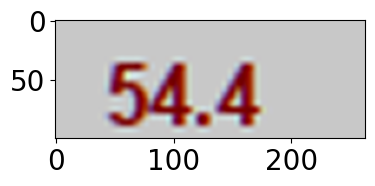

please help me read this lable:  54.4


54.4


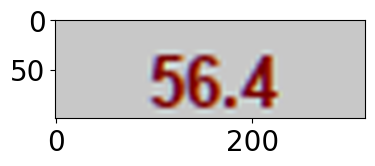

please help me read this lable:  56.4


56.4

14:24:05 Loaded backend module://matplotlib_inline.backend_inline version unknown.
./humidity/new_screen_shots/sc_Graw_GPS_31_2_.png
253.05629238018955
187.21688034188034
14500.0
12000.0


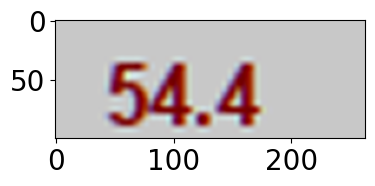

please help me read this lable:  54.4


54.4


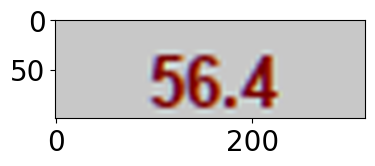

please help me read this lable:  56.4


56.4



In [95]:
## for j in range(1,11):
# for j in range(4,11,1):
j = 10
for i in glob.glob('./humidity/new_screen_shots/*Graw*_31_2_.png')[:]: # MKII_'+str(j)+'
    df = digitize(i, height_input = True, show_plots=False, fm=True)

In [96]:
df_d = pd.read_csv('./mauritius_date.csv')
df_d['dt'] = df_d.date +' '+ df_d.time

for asc in range(1,69):
    if len(glob.glob('./humidity/new_out/*_'+str(asc)+'_*_.csv')) > 0:
        pass
    else:
        continue
    for sonde in ['Vaisala', 'SRS', 'Modem', 'Vais_GPS', 'Sip', 'Meisei', 'Graw_GPS', 'Graw', 'MKII']:
        df = []
        files = glob.glob('./humidity/new_out/'+str(sonde)+'_'+str(asc)+'_*_.csv')
        flen = len(files)
        if flen < 1:
            continue
        for part in range(flen-1,-1,-1):
            files = glob.glob('./humidity/new_out/'+str(sonde)+'_'+str(asc)+'_'+str(part)+'_.csv')
            # if len(files) < 1:
            #     continue
            df_i = pd.read_csv(files[0])
            if part == flen-1:
                df.append(df_i)
            else:
                df.append(df_i[df_i.press > np.max(df[((part+1) - (flen-1))*-1].press)])
                # print((part-6+1)*-1, np.max(df[(part-6+1)*-1].press))
        if df != []:
            df_full = pd.concat(df)
            df_full.drop(columns=['Unnamed: 0'], inplace=True)
            df_full['datetime'] = [df_d[df_d.asc == asc].dt.values[0]]*len(df_full)
            df_full.loc[df_full['hum'] < 0, ['hum']] = 0 
            df_full.to_csv('./humidity/new_files_out/'+str(asc).zfill(2)+'_'+str(sonde)+'.csv' ,index = False)            

In [97]:
# forwards-backwards exponential weighted moving average -> FBEWMA
# Distance away from the FBEWMA that data should be removed.
DELTA = 5 # [%]

# How many samples to run the FBEWMA over.
SPAN = 5

def ewma_fb(df_column, span):
    ''' Apply forwards, backwards exponential weighted moving average (EWMA) to df_column. '''
    # Forwards EWMA.
    fwd = pd.Series.ewm(df_column, span=span).mean()
    # Backwards EWMA.
    bwd = pd.Series.ewm(df_column[::-1],span=10).mean()
    # Add and take the mean of the forwards and backwards EWMA.
    stacked_ewma = np.vstack(( fwd, bwd[::-1] ))
    fb_ewma = np.mean(stacked_ewma, axis=0)
    return fb_ewma
    
    
def remove_outliers(spikey, fbewma, delta):
    ''' Remove data from df_spikey that is > delta from fbewma. '''
    np_spikey = np.array(spikey)
    np_fbewma = np.array(fbewma)
    cond_delta = (np.abs(np_spikey-np_fbewma) > delta)
    np_remove_outliers = np.where(cond_delta, np.nan, np_spikey)
    return np_remove_outliers


for file in glob.glob('./humidity/new_files_out/*.csv')[:]:
    file_seg = file.split('_out')
    out = file_seg[0]+'_out_cleaned'+file_seg[1]
    test = pd.read_csv(file)
    if np.all(test.hum < 105):
        df = test

        DELTA = 15
        SPAN = 5
        df['y_clipped'] = df.hum
        df.loc[(df.y_clipped - df.y_clipped.rolling(10).median()).abs() > df.y_clipped.rolling(10).std()*3., ['y_clipped']] = np.nan
        df['y_ewma_fb'] = ewma_fb(df['y_clipped'], SPAN)
        df['y_remove_outliers'] = remove_outliers(df['y_clipped'].tolist(), df['y_ewma_fb'].tolist(), DELTA)
        df['coarse_result'] = df['y_remove_outliers'].interpolate()

        DELTA = 5
        SPAN = 5
        df['y_clipped_1'] = df.coarse_result
        mask = ((df.y_clipped_1 - df.y_clipped_1.rolling(10).median()).abs() > df.y_clipped_1.rolling(10).std()*2.)
        df.loc[mask, ['y_clipped_1']] = np.nan
        df['y_ewma_fb_1'] = ewma_fb(df['y_clipped_1'], SPAN)
        df['y_remove_outliers_1'] = remove_outliers(df['y_clipped_1'].tolist(), df['y_ewma_fb_1'].tolist(), DELTA)
        df['fine_result'] = df['y_remove_outliers_1'].interpolate()
        
        df['result'] = df['fine_result'].where(df['press'] > 10000, df['coarse_result'])

        # ax = df.plot(x='press', y='hum', color='blue', alpha=0.5)
        # ax2 = df.plot(x='press', y='result', color='black', ax=ax)
        # plt.show()
        # plt.close()
        
        test.hum = df['result']
    if 'Graw' in out:
        deltas = test['press'].diff()[1:]
        gaps = deltas[deltas > 500]
        if len(gaps.index) > 0:
            cutoff = gaps.index[0]
            test.loc[cutoff:, ['hum']] = np.nan
    test.to_csv(out, index=False)
    # print('---')
    


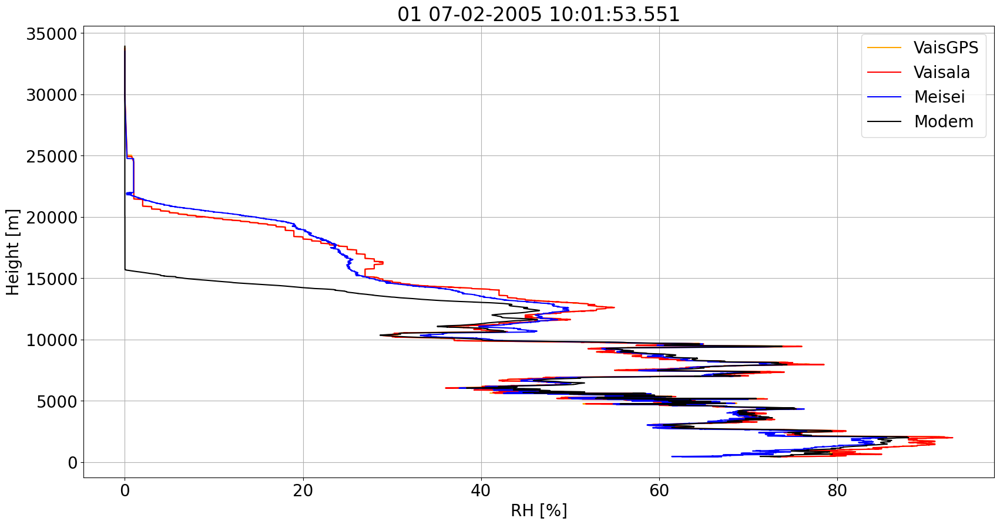

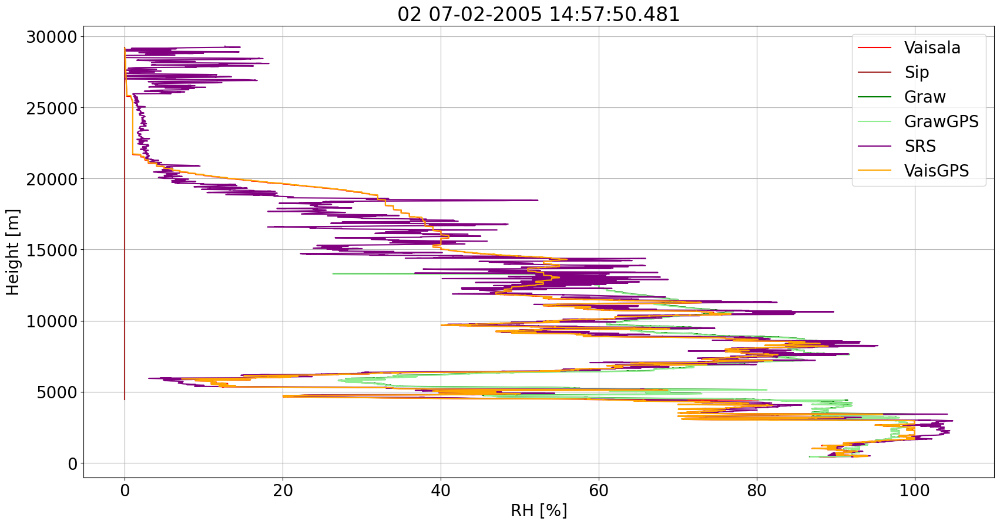

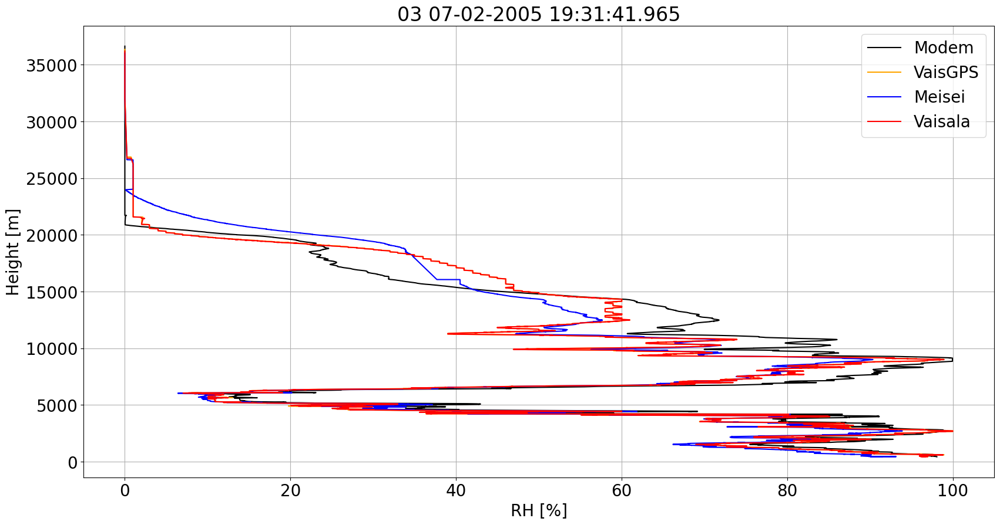

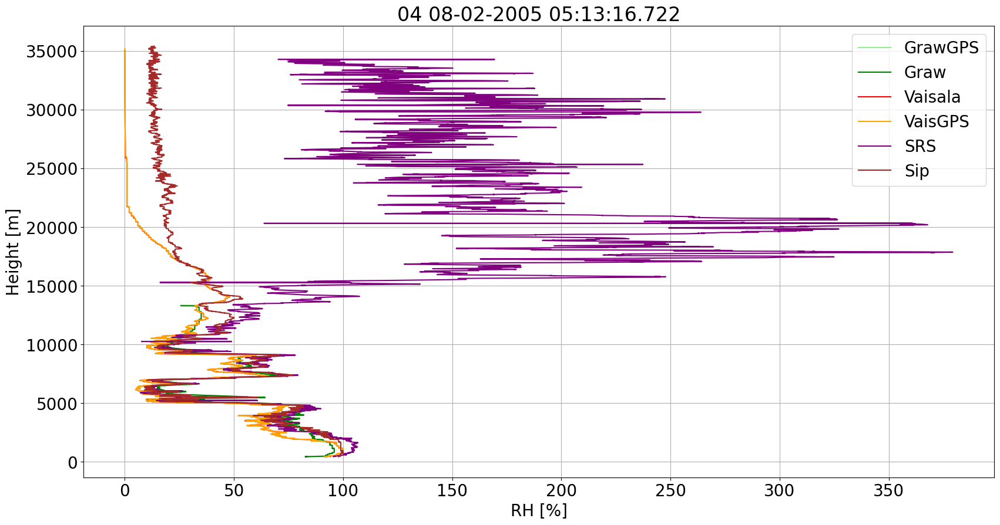

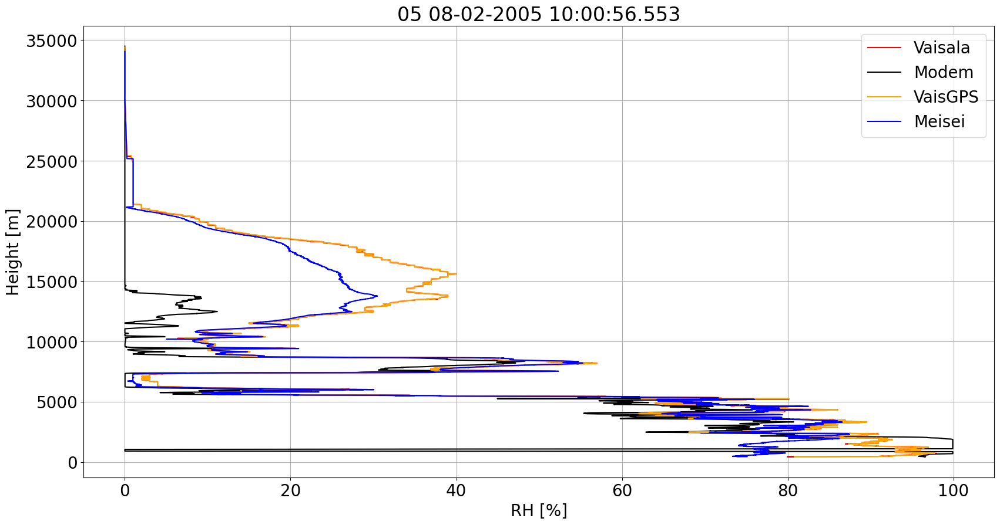

...

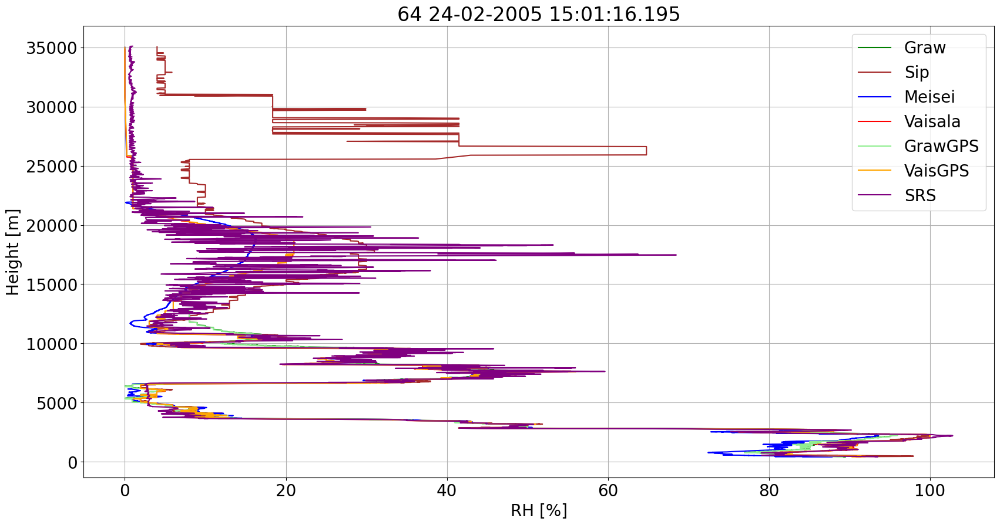

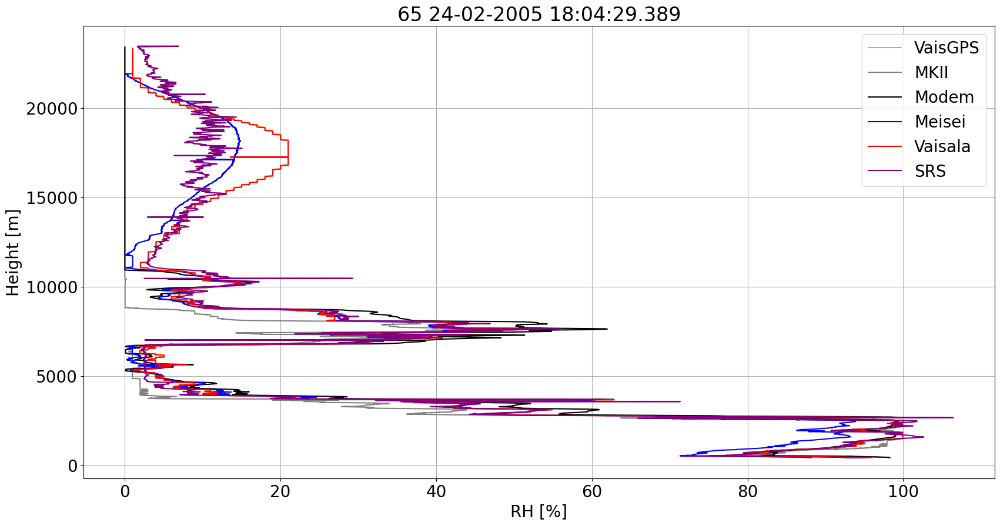

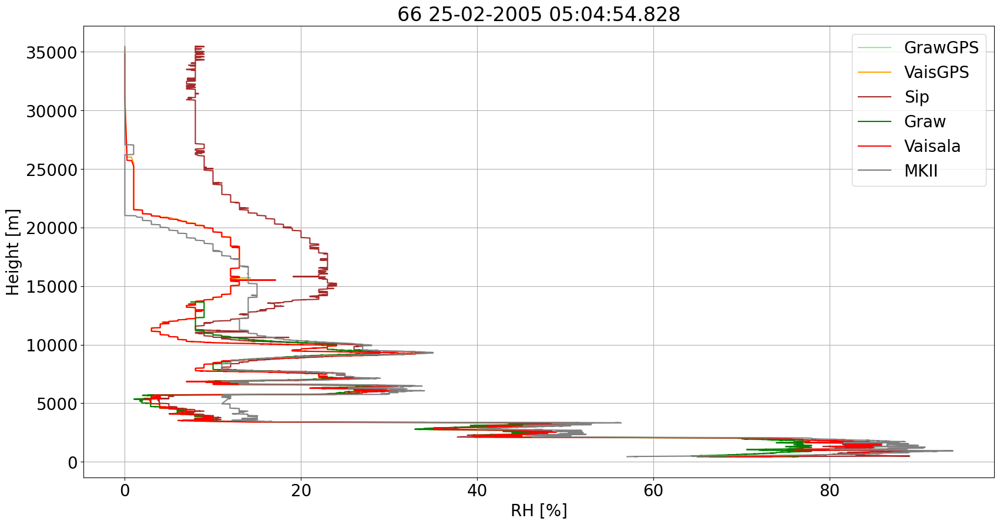

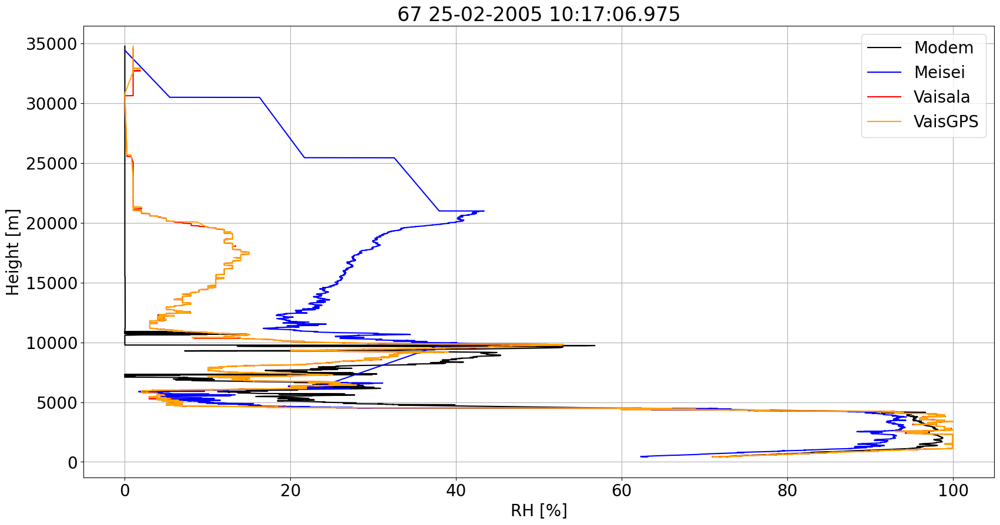

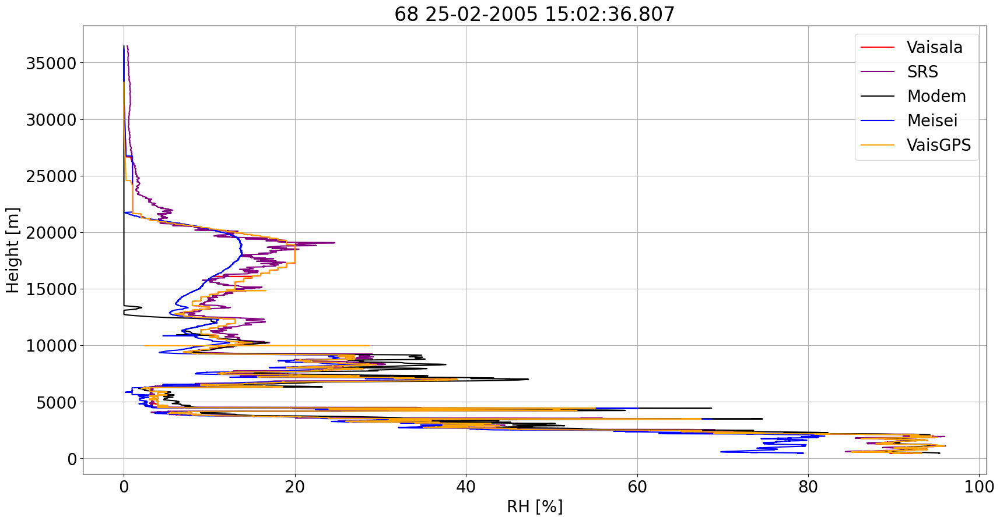

In [98]:
matplotlib.rcParams.update({"font.size": 20})
matplotlib.rcParams["figure.figsize"] = (20, 10)

color_list = {'Vaisala': 'red', 'VaisGPS': 'orange', 'Meisei': 'blue', 'Modem': 'black', 'Graw': 'green', 'GrawGPS': 'lightgreen', 'SRS':'purple', 'Sip':'brown', 'MKII': 'grey'}

for j in range(1,69):
    files_sel = glob.glob('./humidity/new_files_out_cleaned/'+str(j).zfill(2)+'*.csv')
    if len(files_sel)>0:
        for i in files_sel:
            df = pd.read_csv(i)
            ilabel = ''.join(i.split('_')[4:]).split('.csv')[0]
            plt.plot(df.hum, df.press, label=ilabel, color = color_list[ilabel])#, alpha = 0.4, linewidth = 6)
        ax = plt.gca()
        ax.grid()
        plt.title(str(j).zfill(2) + ' ' + df.datetime.iloc[0])
        ax.set_xlabel('RH [%]')
        ax.set_ylabel('Height [m]')
        ax.legend()
        plt.show()
        plt.close